## Analyse SineWorld Outputs

In [ ]:
import pandas as pd
from glob import glob
from pathlib import Path
from hd import HierarchicalDict as HD
from world import SineWorld

In [2]:
root = Path("output/p")
oh_my_glob = sorted(glob(f'{root}/**', recursive=True))

In [3]:
len(oh_my_glob)

2514281

In [4]:
oh_my_glob[100][len(str(root))+1:].split('/', 1)[0]

'a_0'

In [8]:
def sort_folders(file_str_list: list[str], root: str):
    folders = HD()
    for i, path_ in enumerate(file_str_list):
        path__ = path_[len(str(root))+1:].split('/')
        k, v = path__[:-1] + [''], path__[-1]
        if '.' in v:
            folders[k] = folders.get(k, []) + [v]
    return folders

folders = sort_folders(oh_my_glob, 'output/p')

In [172]:
def agent_data():
    root = Path('output/p')
    for i in range(8):
        _agent_data = []
        addr = [f"a_{i}", 'days', '']
        agent_days = folders[addr]
        for j in range(4):
            dfs = agent_days[j::4]
            short = len(dfs[0])
            fnames = [
                fname for fname in agent_days[j::4] if len(fname)==short
            ] + [
                fname for fname in agent_days[j::4] if len(fname)>short
            ]
            datapath = root / addr[0] / addr[1]
            datapaths = [
                (datapath / fname) for fname in fnames
            ]
            _agent_data.append([pd.read_csv(dp) if str(dp).endswith('.csv') else pd.read_parquet(dp) for dp in datapaths])
        yield _agent_data


In [173]:
it = agent_data()
data = next(it)

In [174]:
data

[[    Unnamed: 0                                                obs     value  \
  0            0  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ... -0.032671   
  1            1  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ... -0.143924   
  2            2  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ... -0.143924   
  3            3  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ... -0.021466   
  4            4  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ... -0.021466   
  ..         ...                                                ...       ...   
  95          95  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...  0.060366   
  96          96  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...  0.044283   
  97          97  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...  0.060366   
  98          98  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...  0.060366   
  99          99  [0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...  0.060366   
  
        reward ('act', 'c

In [175]:
data[1]

[                                                tree   t  exists  \
 0                                               None   0   False   
 1  ([float]<POLY>([float]<POLY>([float]<POLY>([fl...  61    True   
 2  ([float]<POLY>([float]<POLY>([float]$x)([float...  48    True   
 3  ([float]<POLY>([float]<POLY>([float]0.20630687...  52    True   
 4  ([float]<POLY>([float]0.12140751756171331)([fl...  99    True   
 5  ([float]<POLY>([float]<POLY>([float]<POLY>([fl...  31    True   
 
             mse        rmse  size  depth  raw_fitness   fitness     value  \
 0      0.000000    0.000000   0.0    0.0     0.000000  0.000000  0.000000   
 1   4517.143664   67.209699  37.0    6.0     0.003512  0.007374  0.986984   
 2   4417.607881   66.465088  49.0    7.0     0.004848  0.010106  1.041670   
 3  16602.029685  128.848864  37.0    6.0     0.001845  0.003367  0.544550   
 4   3614.269951   60.118799  41.0    9.0     0.006534  0.013109  1.066360   
 5   3548.684858   59.570839  29.0    6.0     0

In [176]:
cols = data[1][0].columns
cols

Index(['tree', 't', 'exists', 'mse', 'rmse', 'size', 'depth', 'raw_fitness',
       'fitness', 'value', 'crossover_rate', 'mutation_rate', 'mutation_sd',
       'max_depth', 'max_size', 'temp_coeff', 'pop', 'elitism', 'obs_start',
       'obs_stop', 'obs_num'],
      dtype='object')

In [177]:
for dfs in data[1:]:
    for df in dfs:
        df['obs_width'] = (df['obs_stop']-df['obs_start']).abs()

In [178]:
cols = data[1][0].columns
cols

Index(['tree', 't', 'exists', 'mse', 'rmse', 'size', 'depth', 'raw_fitness',
       'fitness', 'value', 'crossover_rate', 'mutation_rate', 'mutation_sd',
       'max_depth', 'max_size', 'temp_coeff', 'pop', 'elitism', 'obs_start',
       'obs_stop', 'obs_num', 'obs_width'],
      dtype='object')

In [186]:
summary_data = pd.DataFrame()
for i in range(1, 4):
    for col in cols[3:]:
        summary_data[f'{col}_min_{i-1}'] = [df[col][df['exists']].min() for df in data[i]]
        summary_data[f'{col}_mean_{i-1}'] = [df[col][df['exists']].mean() for df in data[i]]
        summary_data[f'{col}_max_{i-1}'] = [df[col][df['exists']].max() for df in data[i]]
summary_data = summary_data.copy()

/var/folders/2s/vq2lnwx92y12_p32vv6jbzhr0000gn/T/ipykernel_86336/3759563931.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  summary_data[f'{col}_mean_{i-1}'] = [df[col][df['exists']].mean() for df in data[i]]
/var/folders/2s/vq2lnwx92y12_p32vv6jbzhr0000gn/T/ipykernel_86336/3759563931.py:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  summary_data[f'{col}_max_{i-1}'] = [df[col][df['exists']].max() for df in data[i]]
/var/folders/2s/vq2lnwx92y12_p32vv6jbzhr0000gn/T/ipykernel_86336/3759563931.py:4: PerformanceWarning: DataFram

In [187]:
summary_data

,mse_min_0,mse_mean_0,mse_max_0,rmse_min_0,rmse_mean_0,rmse_max_0,size_min_0,size_mean_0,size_max_0,depth_min_0,...,obs_start_max_2,obs_stop_min_2,obs_stop_mean_2,obs_stop_max_2,obs_num_min_2,obs_num_mean_2,obs_num_max_2,obs_width_min_2,obs_width_mean_2,obs_width_max_2
0,3548.684858,6.539947e+03,1.660203e+04,59.570839,7.644266e+01,1.288489e+02,29.0,38.600000,49.0,6.0,...,8.384158,0.482904,9.157821,18.382197,33.0,42.750000,56.0,9.556438e+00,12.495879,18.003679
1,5.875491,6.720004e+05,4.011500e+06,2.423941,3.692763e+02,2.002873e+03,29.0,39.000000,53.0,5.0,...,8.384158,-9.786713,6.797054,18.382197,39.0,56.400000,79.0,8.785007e+00,21.777417,40.626941
2,52.899964,1.560427e+30,9.362560e+30,7.273236,5.099717e+14,3.059830e+15,25.0,35.000000,45.0,5.0,...,8.384158,-5.401432,8.249310,18.382197,39.0,55.000000,79.0,1.893549e+00,23.730463,40.626941
3,52.899964,2.108161e+03,5.555708e+03,7.273236,3.973067e+01,7.453662e+01,25.0,32.333333,45.0,5.0,...,8.384158,-9.503963,7.869379,18.382197,33.0,48.500000,79.0,1.109435e+00,24.366206,40.626941
4,5.934170,1.393919e+03,3.548685e+03,2.436015,3.082705e+01,5.957084e+01,13.0,31.666667,45.0,4.0,...,8.384158,0.602668,7.129363,18.382197,33.0,48.666667,74.0,3.813830e-01,17.295368,38.982814
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,0.008800,4.299996e+03,1.867638e+04,0.093806,4.157016e+01,1.366615e+02,5.0,48.333333,217.0,2.0,...,45.674268,-30.419241,5.728687,49.999879,2.0,37.166667,56.0,6.022284e-01,4.480523,18.367357
96,0.008800,3.583740e+03,1.867638e+04,0.093806,3.490334e+01,1.366615e+02,5.0,16.333333,33.0,2.0,...,4.114760,-50.000000,-20.402228,4.716988,2.0,56.833333,91.0,4.234451e-09,3.431066,16.998452
97,0.008800,4.229147e+02,2.494224e+03,0.093806,1.036809e+01,4.994221e+01,5.0,21.000000,33.0,2.0,...,4.114760,-50.000000,-28.842315,4.716988,2.0,62.833333,91.0,7.230526e-09,3.033818,16.998452
98,0.008800,2.543132e+26,1.525879e+27,0.093806,6.510440e+12,3.906250e+13,5.0,43.666667,157.0,2.0,...,4.114760,-50.000000,-23.320917,4.716988,51.0,71.666667,92.0,8.290016e-09,0.597990,2.383485


In [189]:
def plot_col_one_stat(col, stat):
    summary_data[[f'{col}_{stat}_{i}' for i in range(3)]].plot()

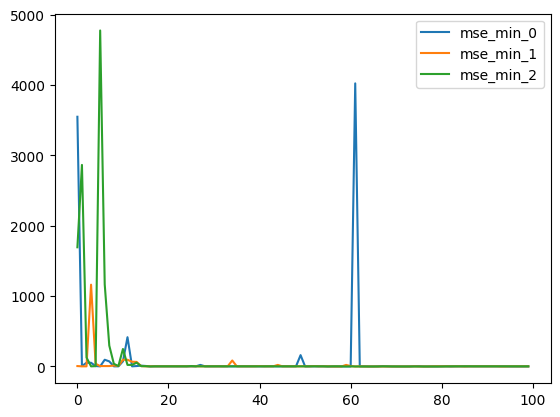

In [190]:
plot_col_one_stat('mse', 'min')

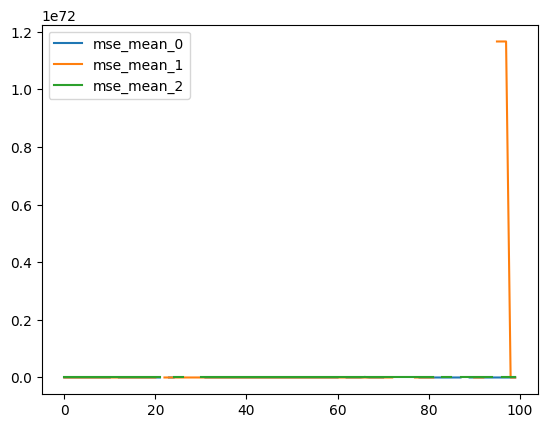

In [191]:
plot_col_one_stat('mse', 'mean')

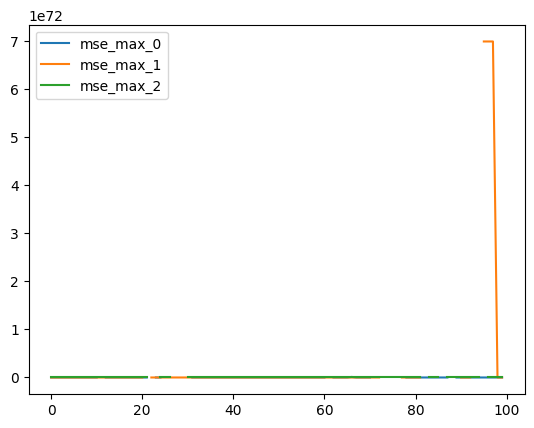

In [192]:
plot_col_one_stat('mse', 'max')

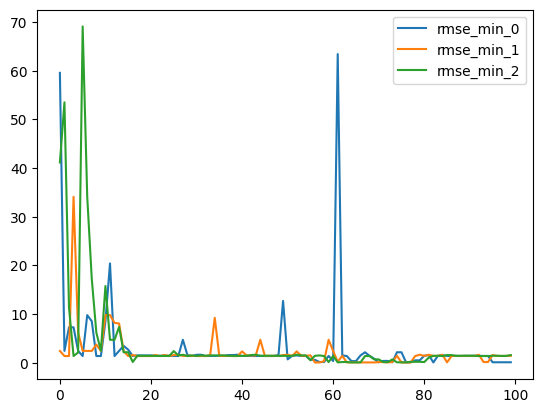

In [193]:
plot_col_one_stat('rmse', 'min')

In [194]:
def plot_col(col):
    for stat in ('min', 'mean', 'max'):
        plot_col_one_stat(col, stat)

In [201]:
def some_graphs():
    go, end = 5, 11
    while go < len(cols):
        for col in cols[go:end]:
            print(col)
            plot_col(col)
        yield
        go, end = end, end+6

size
depth
raw_fitness
fitness
value
crossover_rate


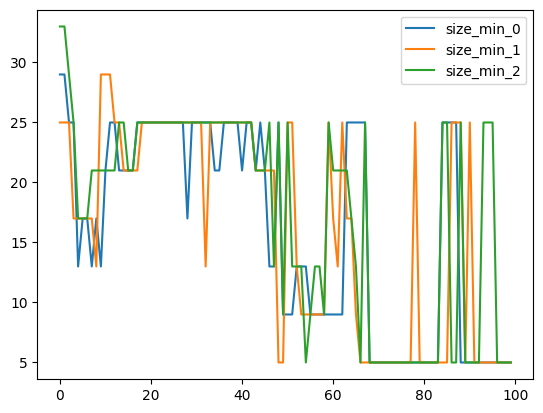

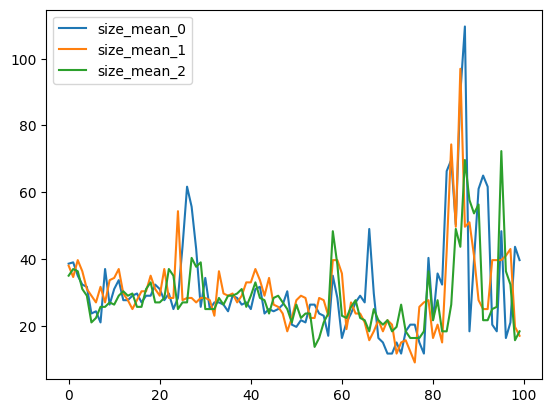

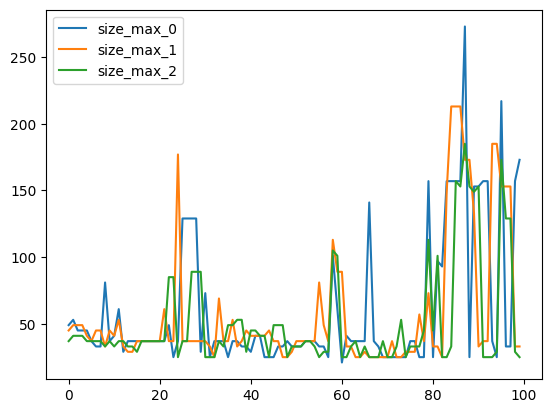

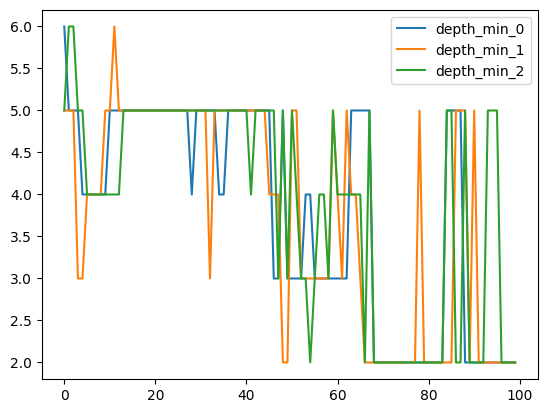

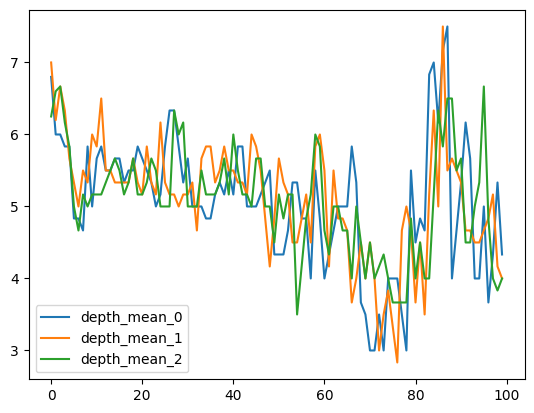

...

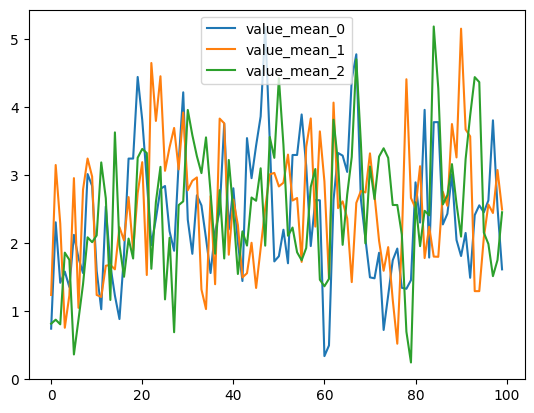

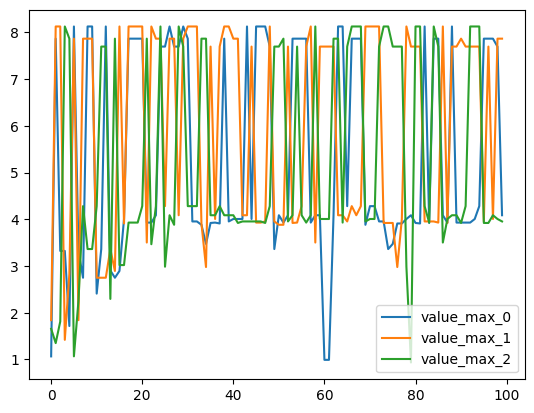

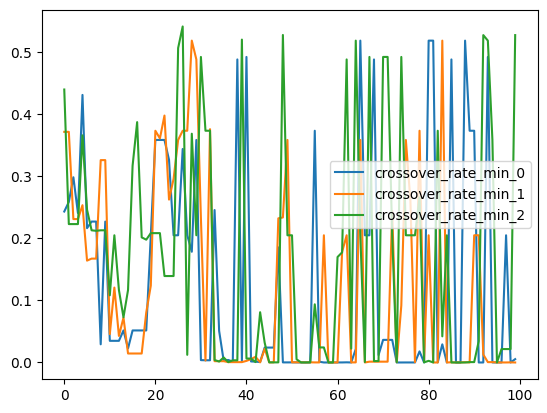

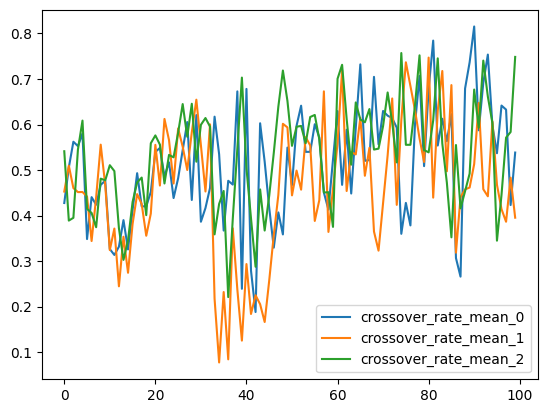

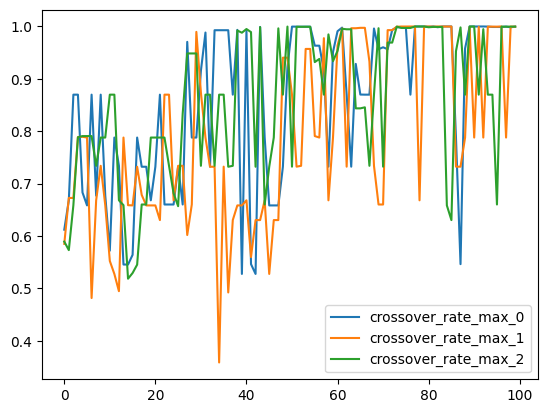

In [202]:
graph_it = some_graphs()
next(graph_it)

mutation_rate
mutation_sd
max_depth
max_size
temp_coeff
pop


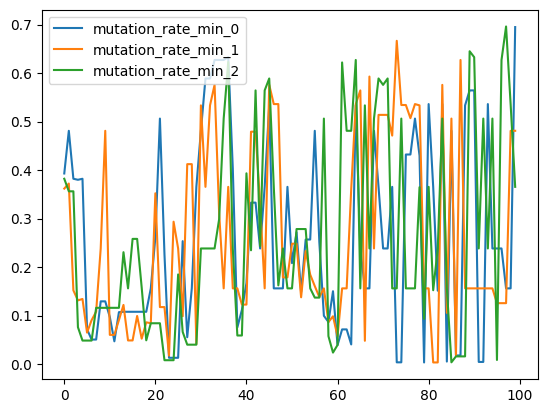

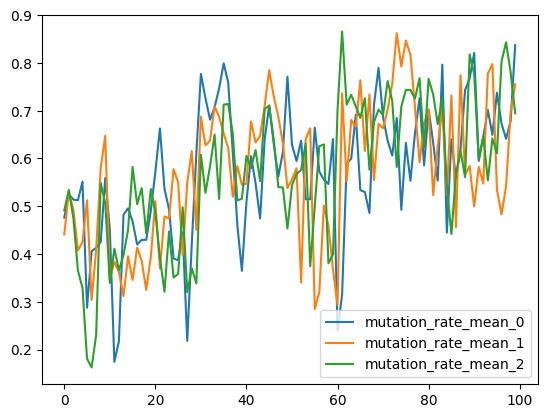

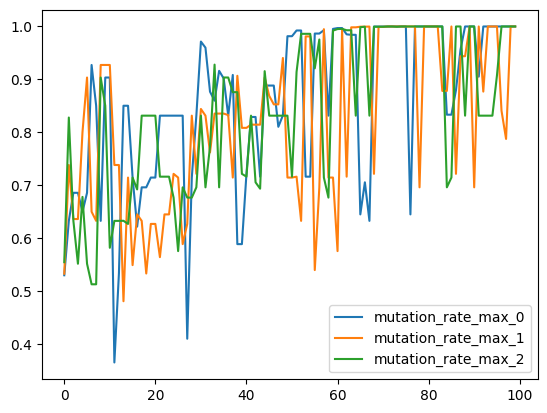

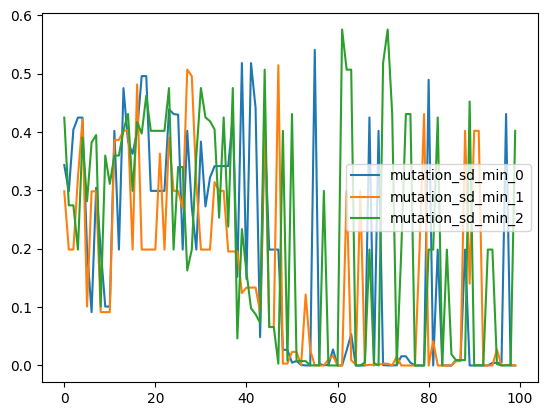

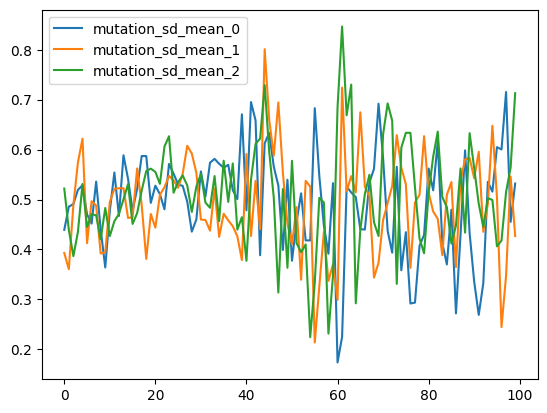

...

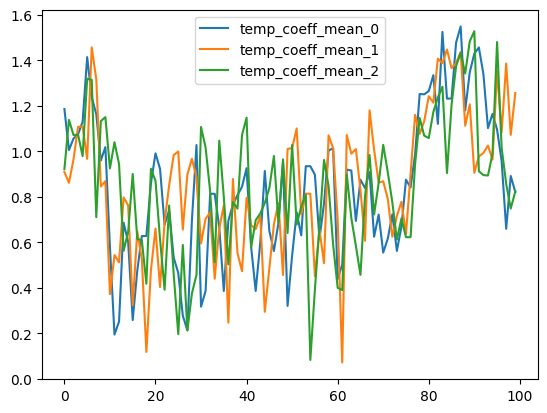

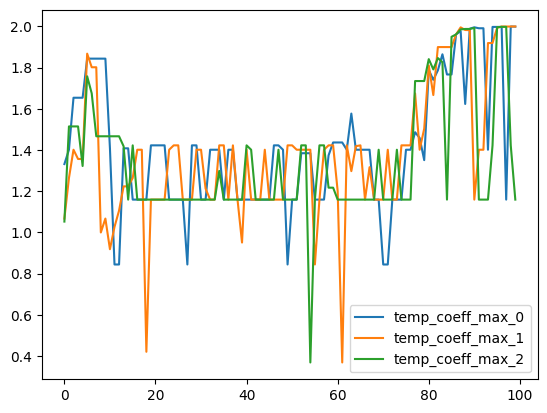

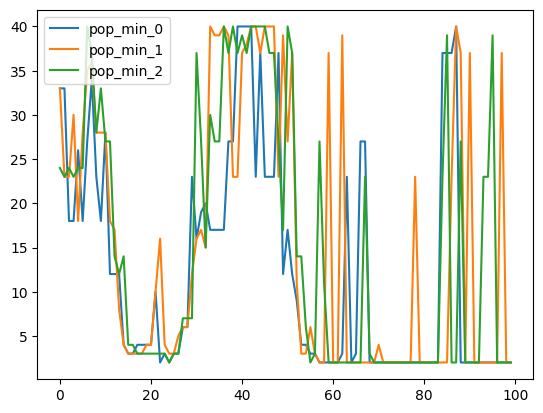

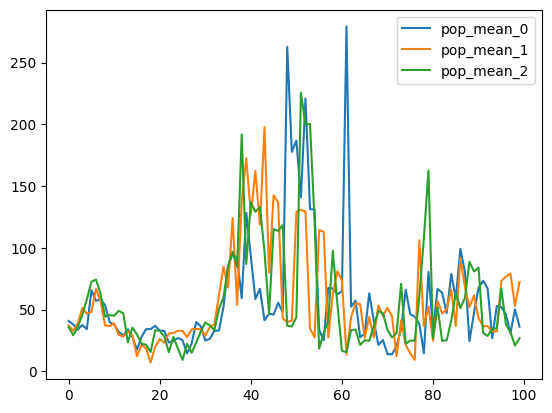

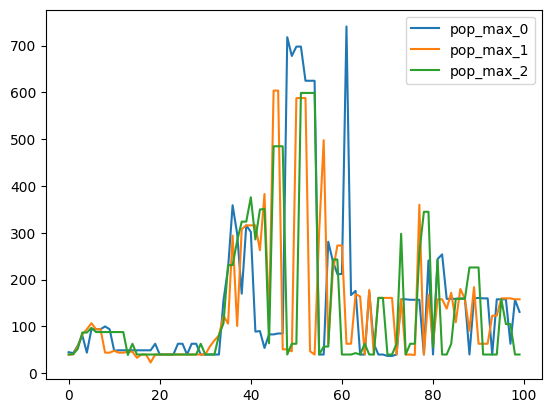

In [203]:
next(graph_it)

elitism
obs_start
obs_stop
obs_num
obs_width


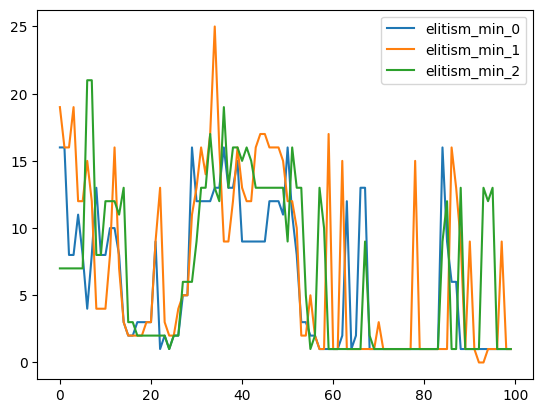

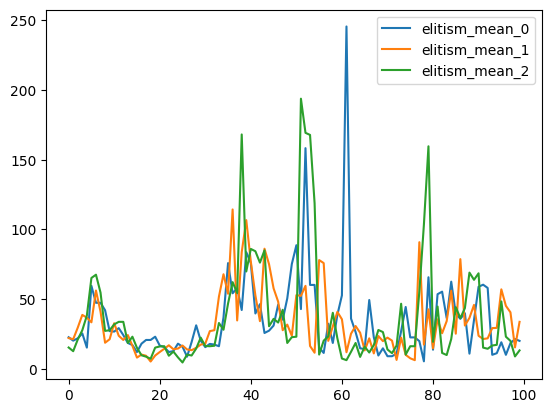

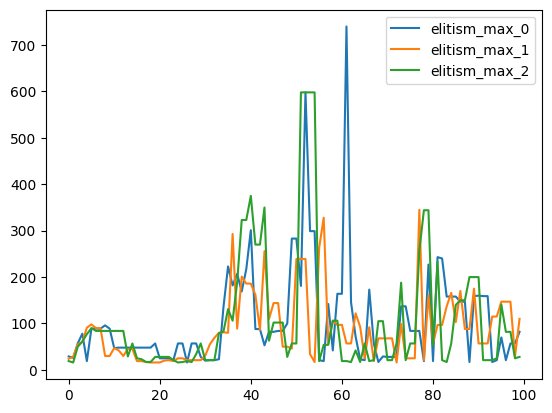

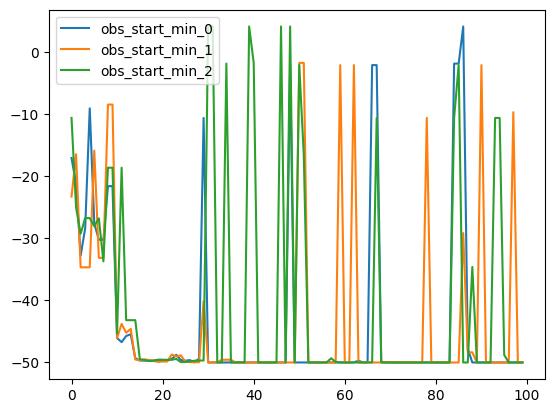

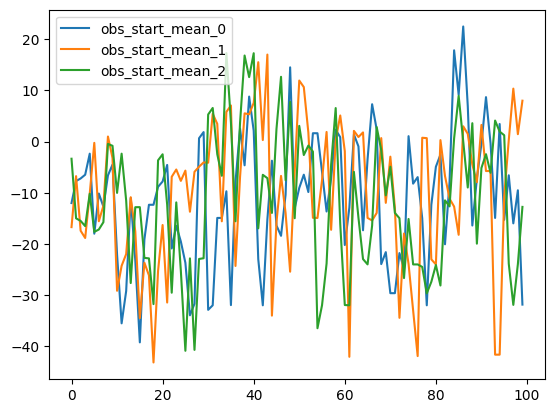

...

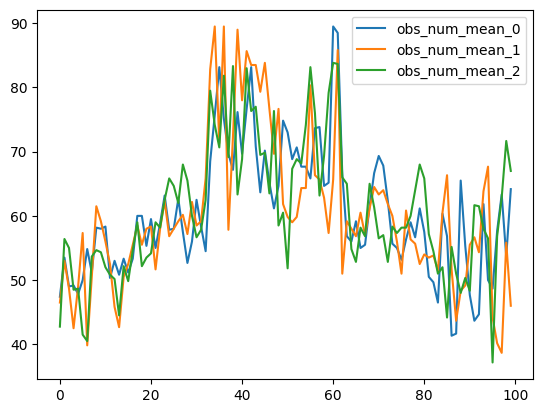

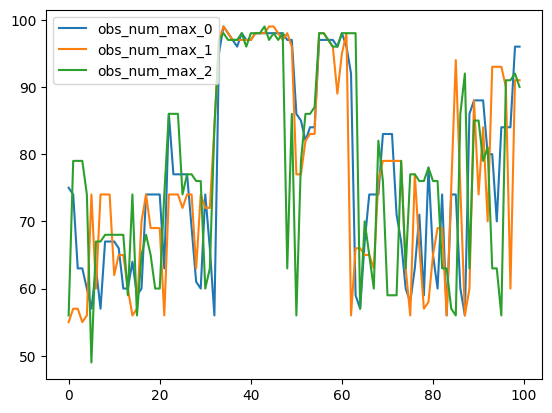

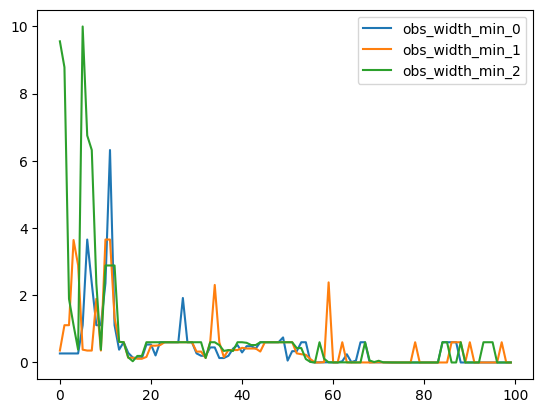

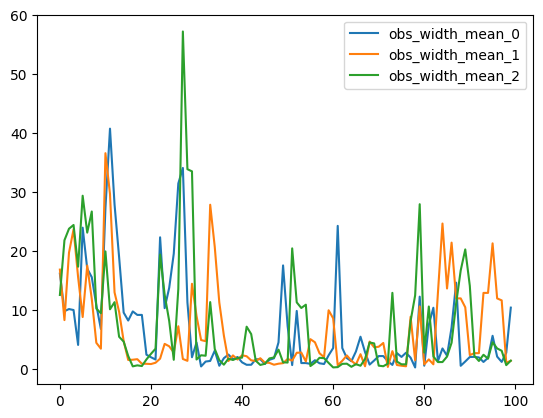

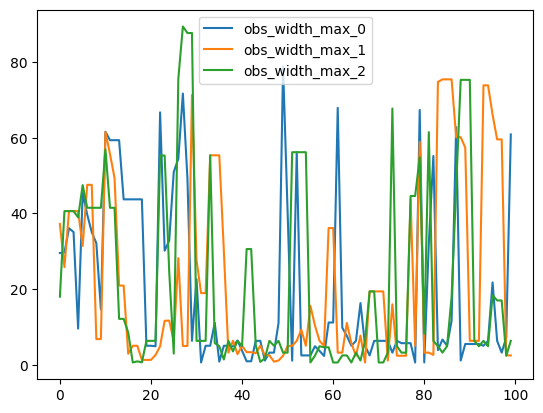

In [204]:
next(graph_it)

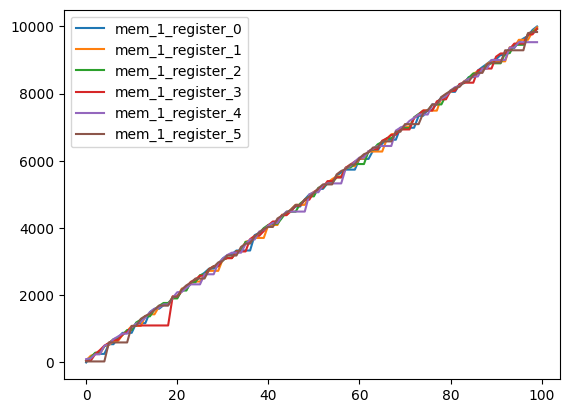

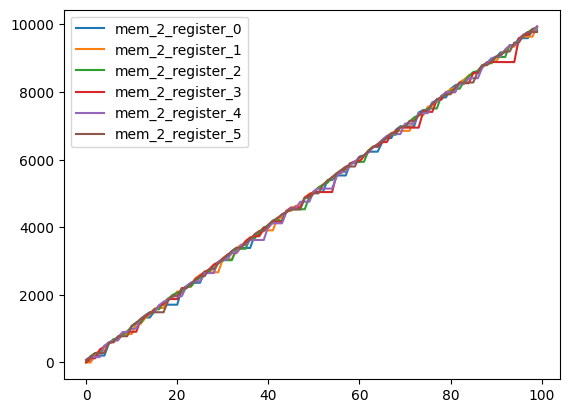

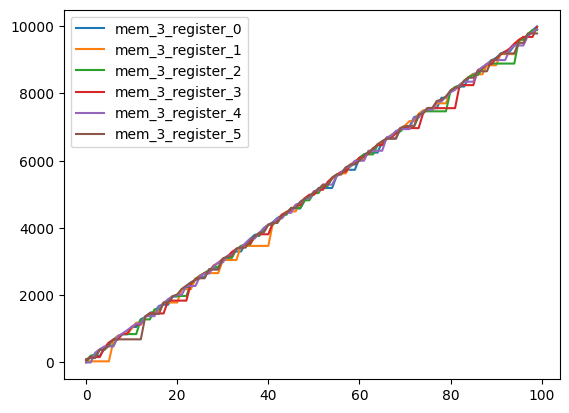

In [198]:
for j in range(1, 4):
    t_vals = pd.DataFrame()
    for i in range(6):
        t_vals[f'mem_{j}_register_{i}'] = [df.at[i, 't'] for df in data[j]]
    t_vals.plot()

In [251]:
def get_bests(targ: str, data: list[pd.DataFrame]|list[list[pd.DataFrame]], max=True):
    if isinstance(data[0], list) and isinstance(data[0][0], pd.DataFrame):
        data = [pd.concat(dfs, ignore_index=True) for dfs in zip(*data[1:4])]
    bests = pd.DataFrame()
    cols = data[0].columns[3:]
    for col in cols:
        best_vals = []
        for df in data:
            df_ = df[df['exists']]
            if max:
                best_vals.append(df_[col][df_[targ]==df_[targ].max()].item())
            else:
                best_vals.append(df_[col][df_[targ]==df_[targ].min()].item())
        bests[col] = best_vals
    return bests
    


In [275]:
def plot_bests(targ, data, max=True):
    bests = get_bests(targ, data, max=max)
    for col in bests:
        pd.DataFrame({col: bests[col]}).plot(title=col)

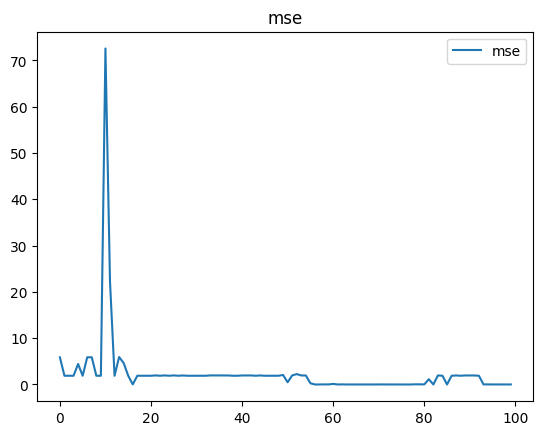

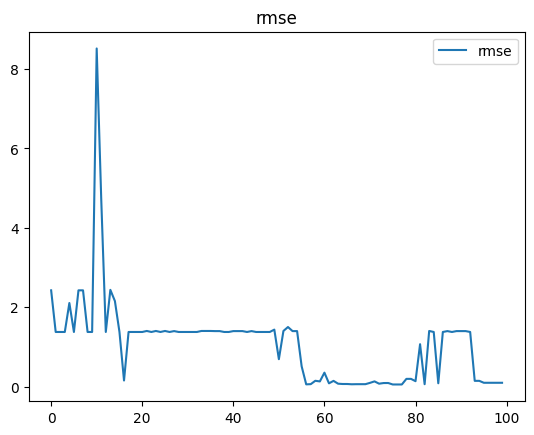

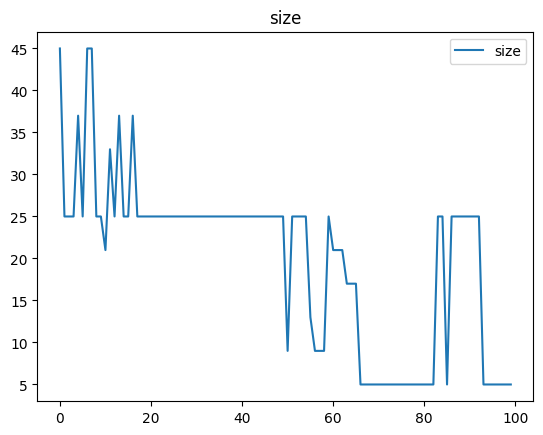

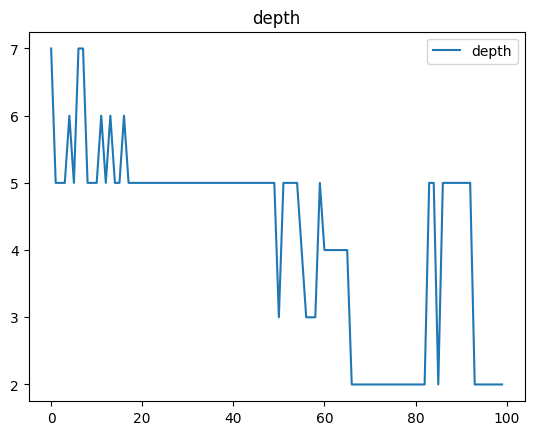

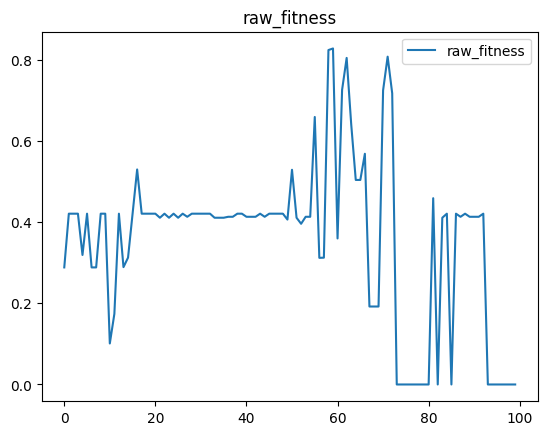

...

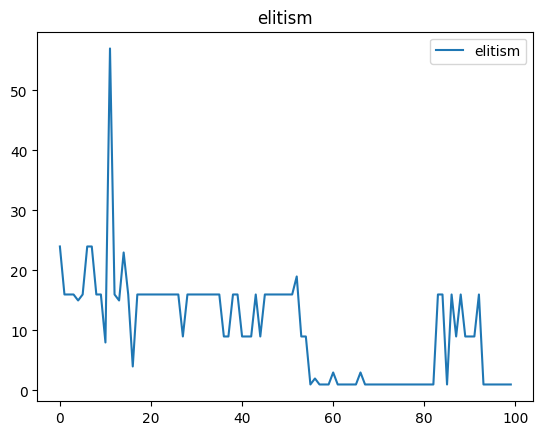

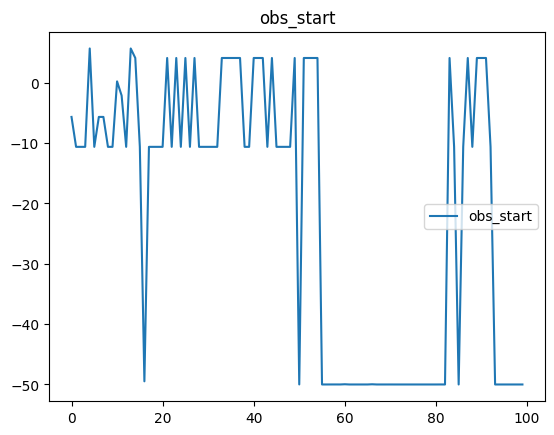

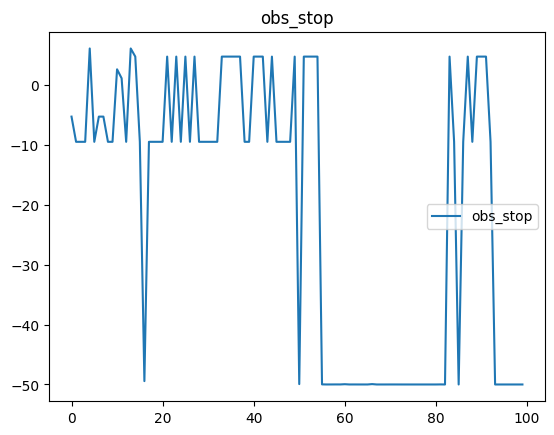

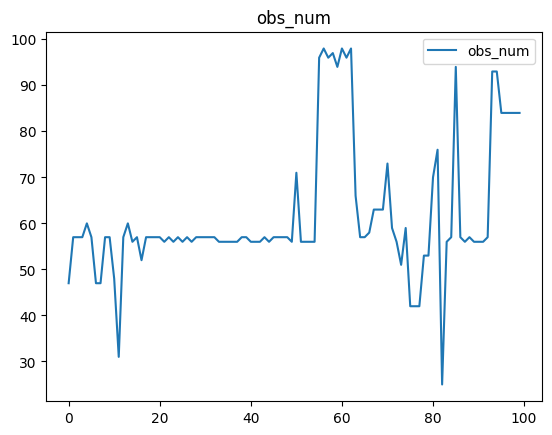

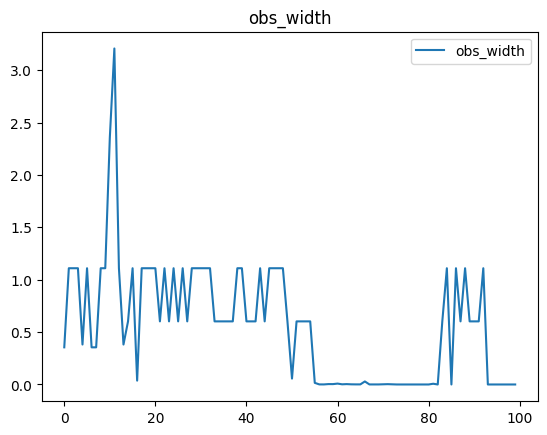

In [277]:
plot_bests('mse', data, max=False)

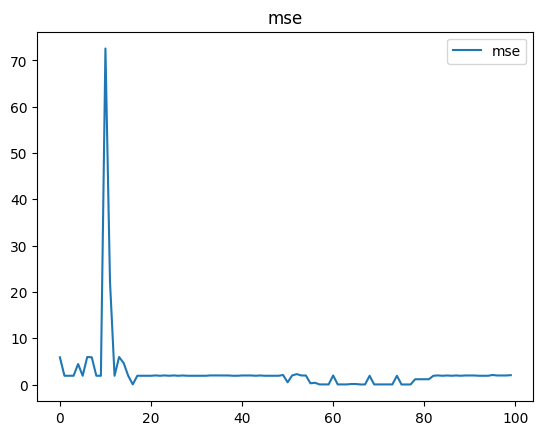

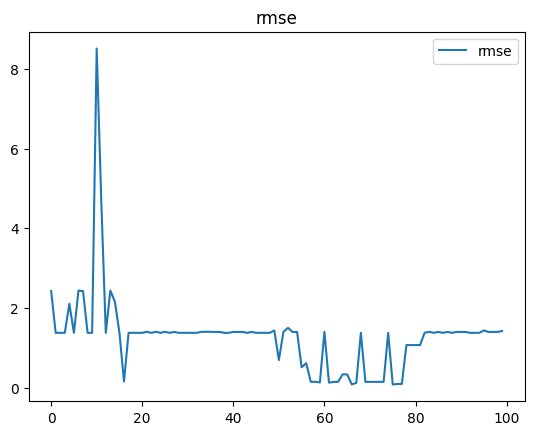

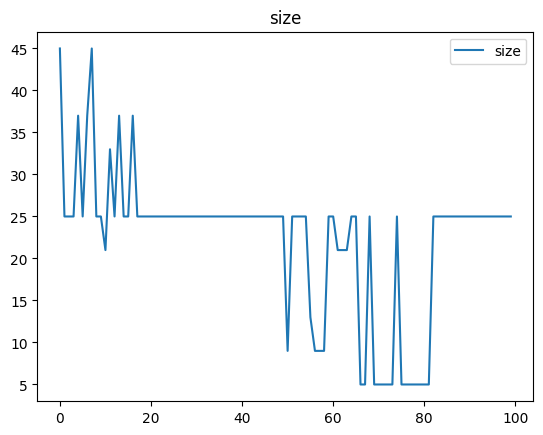

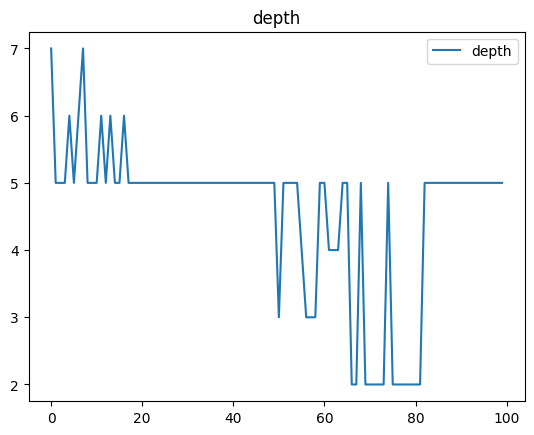

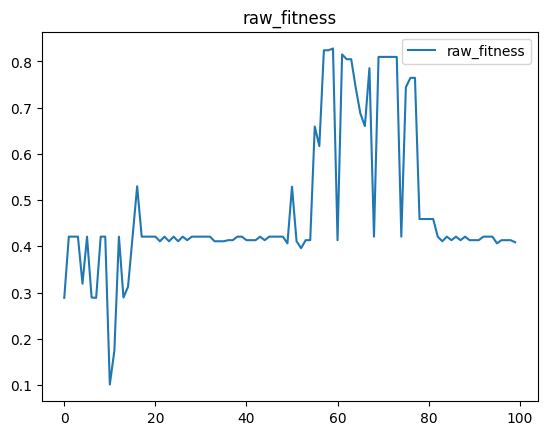

...

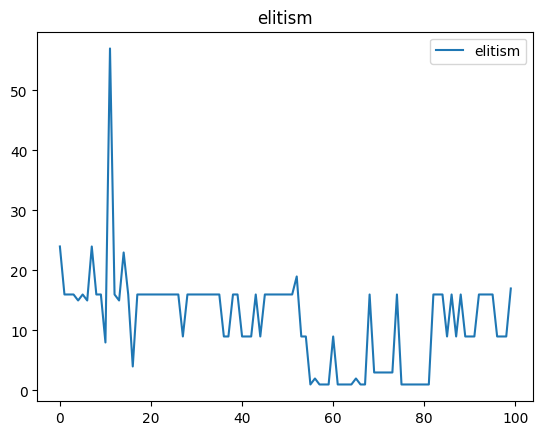

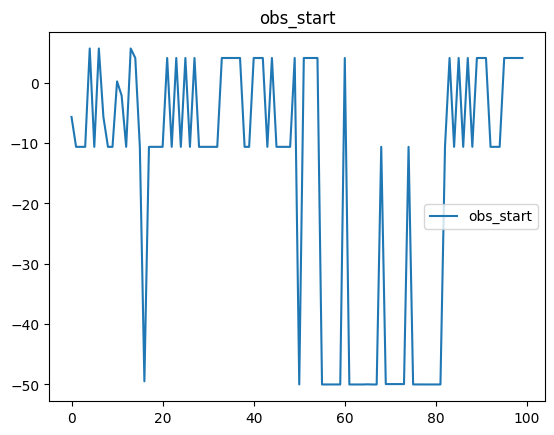

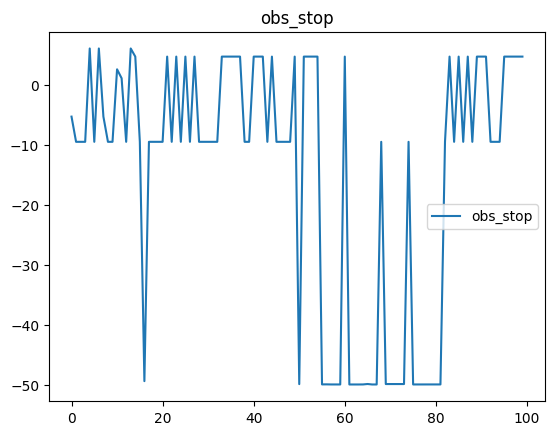

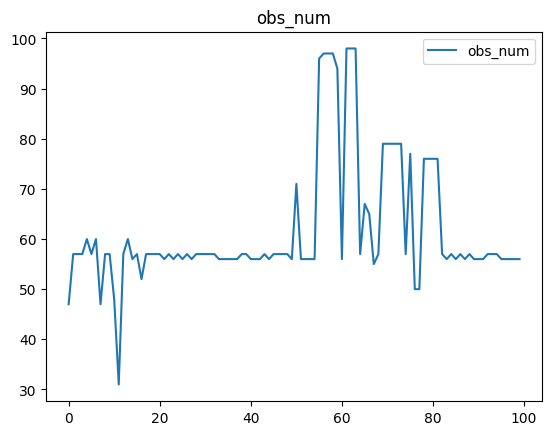

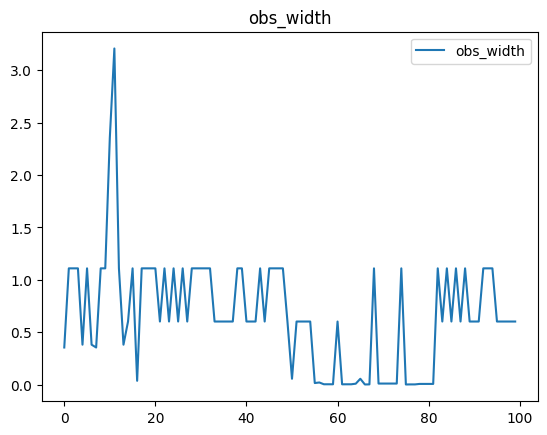

In [278]:
plot_bests('raw_fitness', data)

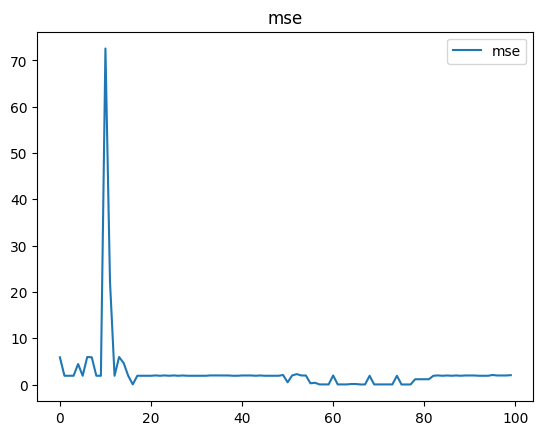

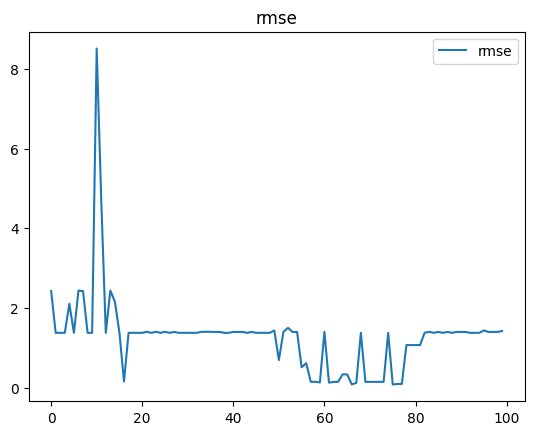

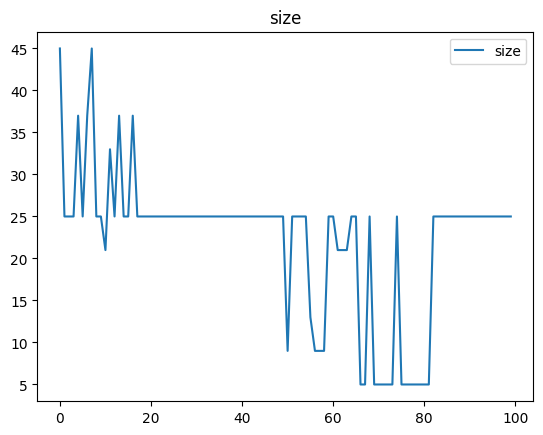

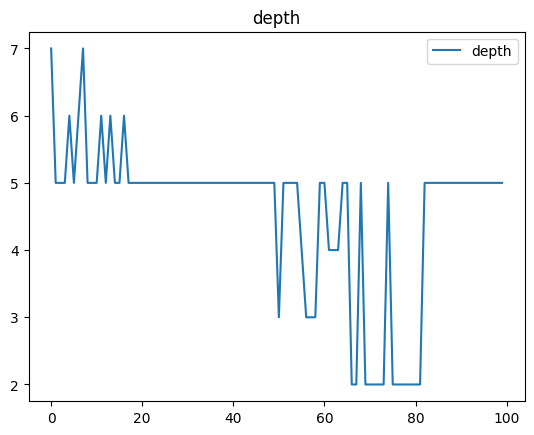

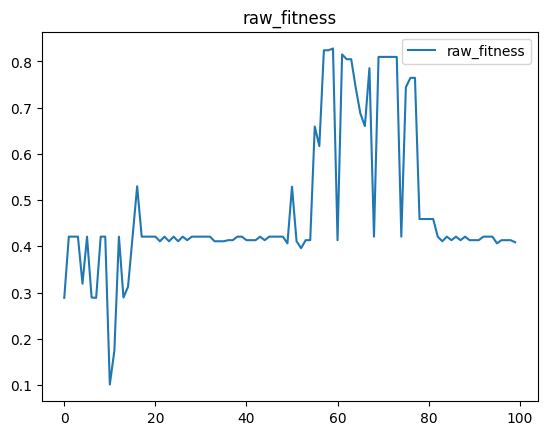

...

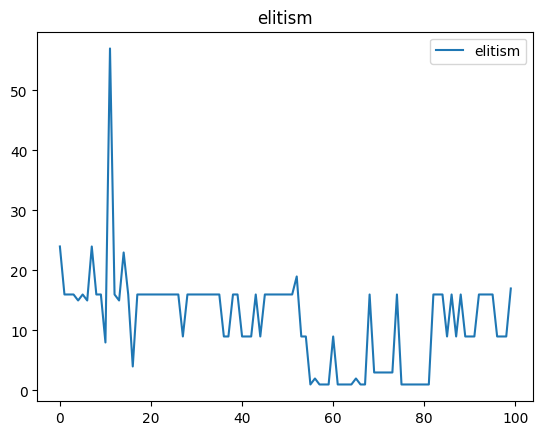

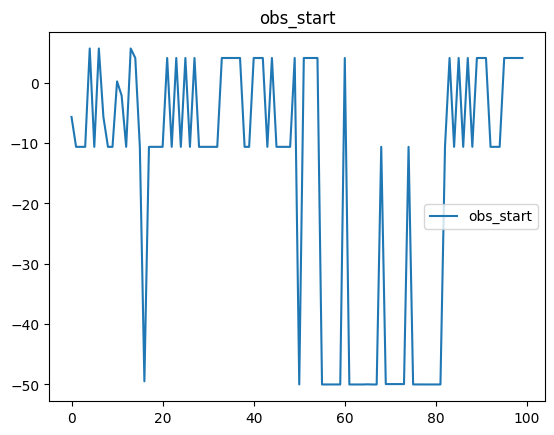

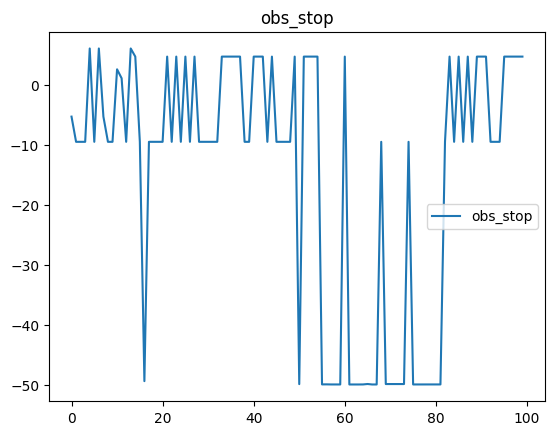

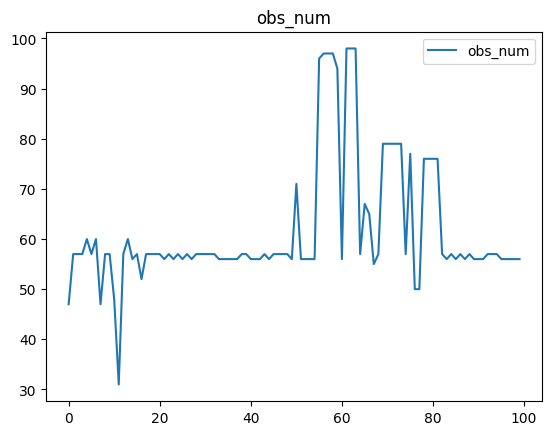

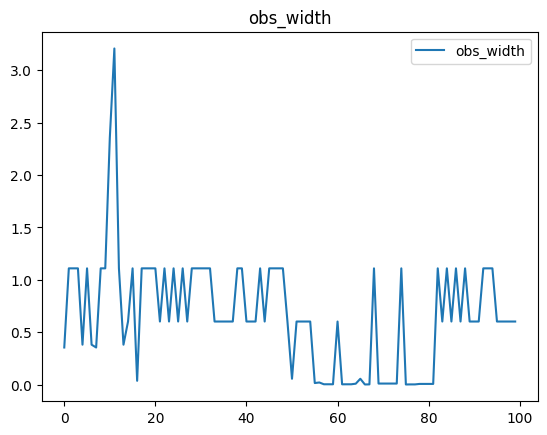

In [279]:
plot_bests('raw_fitness', data)

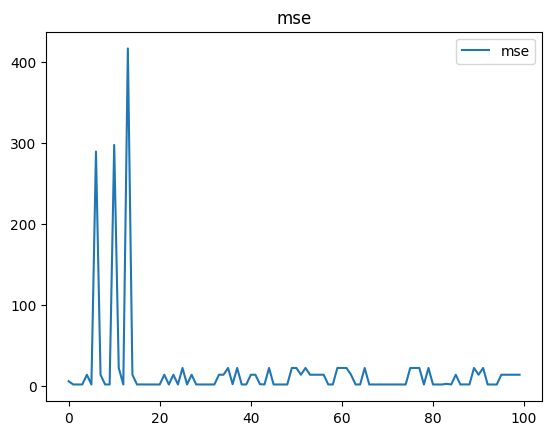

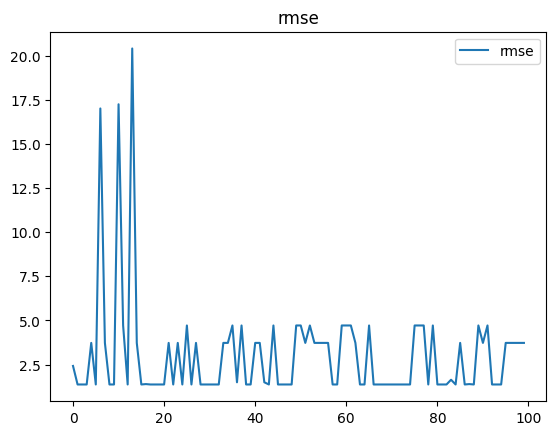

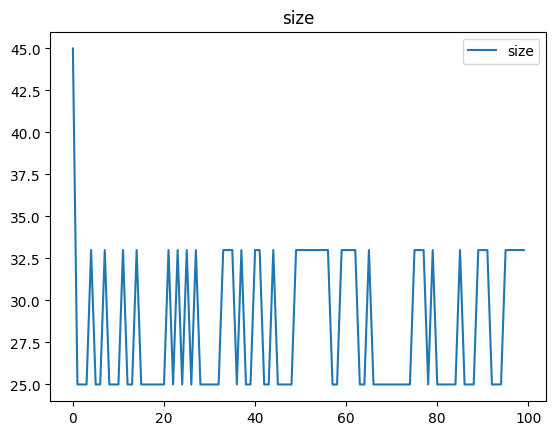

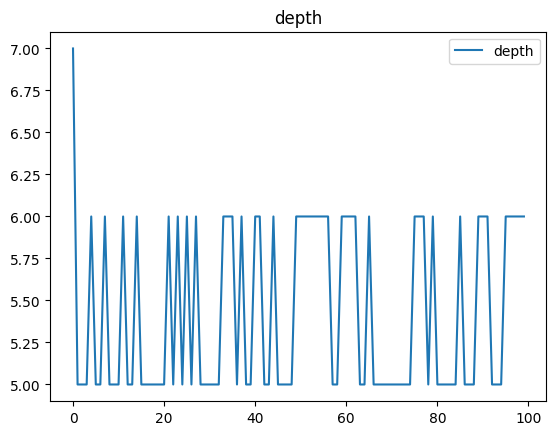

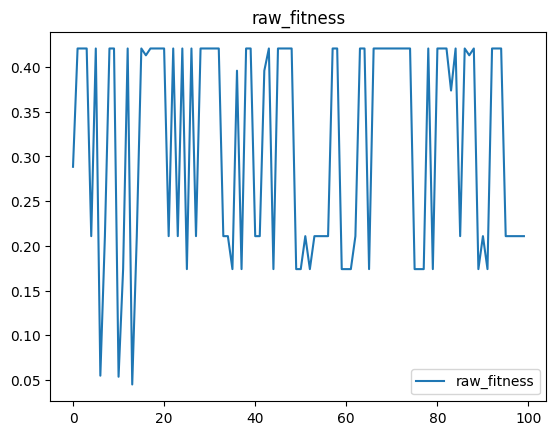

...

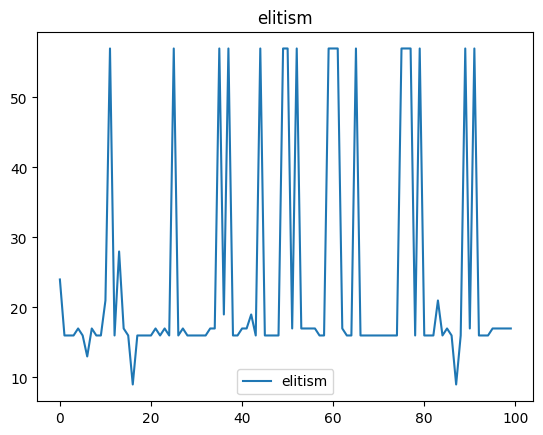

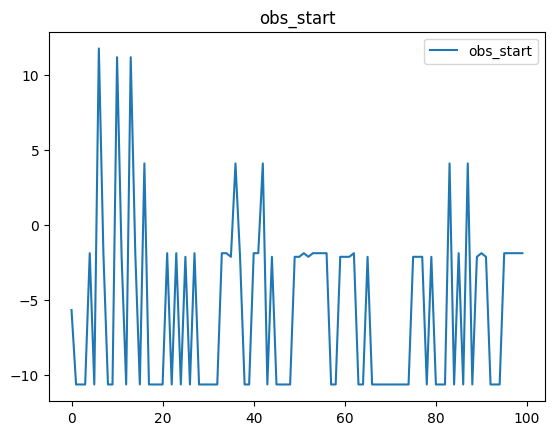

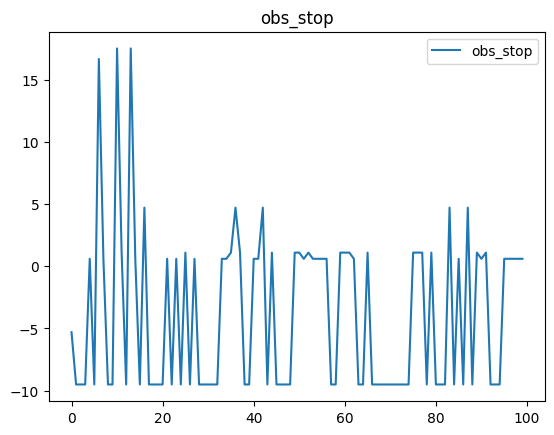

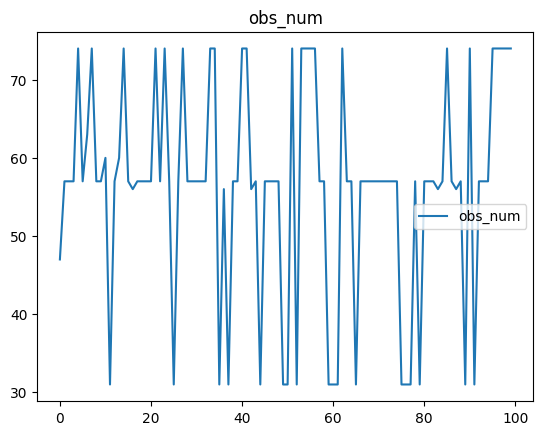

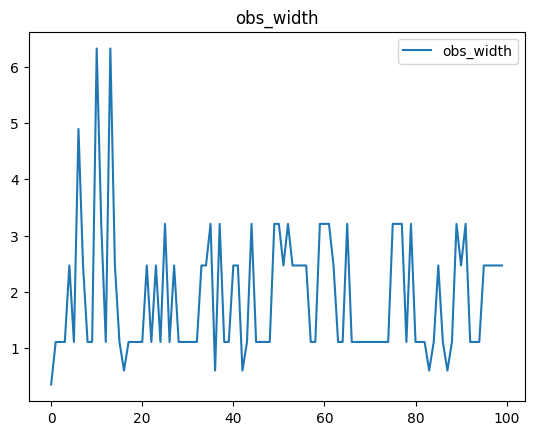

In [280]:
plot_bests('value', data)

In [281]:
def regress_all(targ: str, data: list[pd.DataFrame]|list[list[pd.DataFrame]]):
    print(targ)
    if isinstance(data[0], list) and isinstance(data[0][0], pd.DataFrame):
        data = [pd.concat(dfs, ignore_index=True) for dfs in zip(*data[1:4])]
    data = pd.concat(data)
    data = data[data['exists']]
    for col in data.columns[3:]:
        if col!=targ:
            data.plot(x=col, y=targ, kind='scatter', title=f'{col} vs {targ}')

value


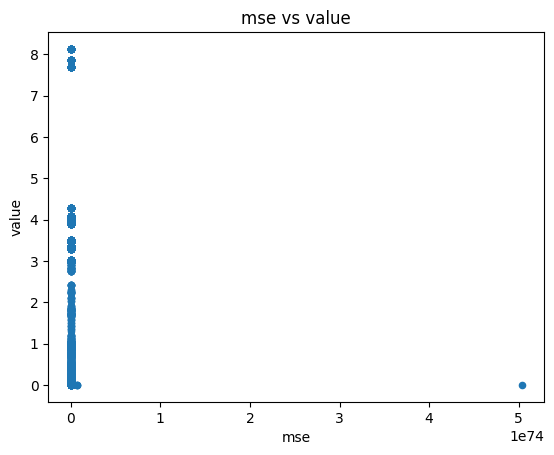

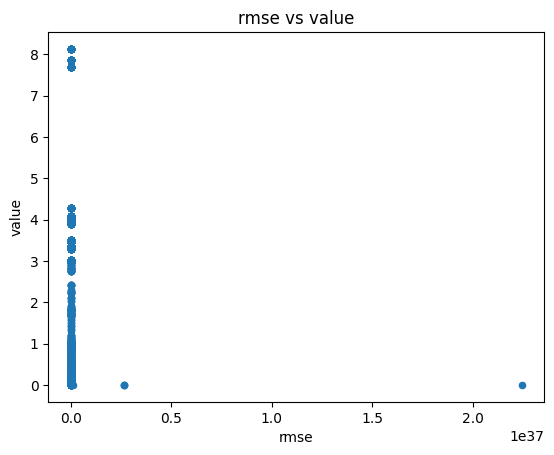

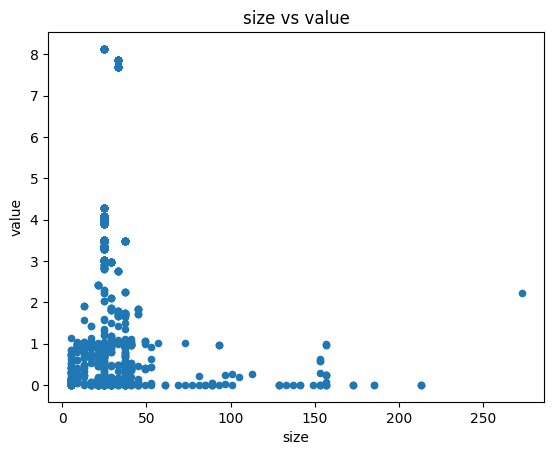

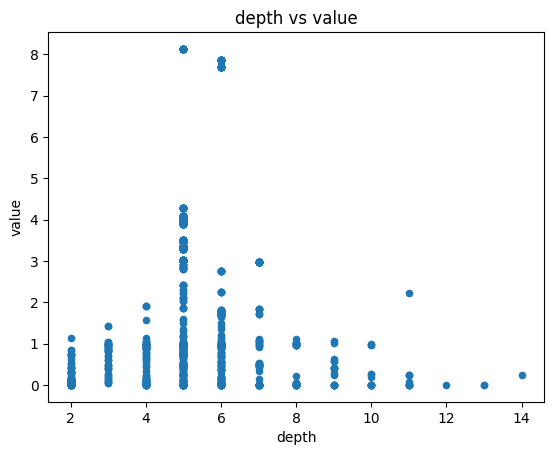

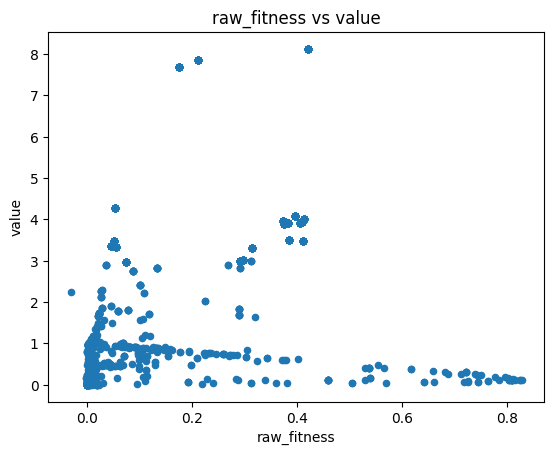

...

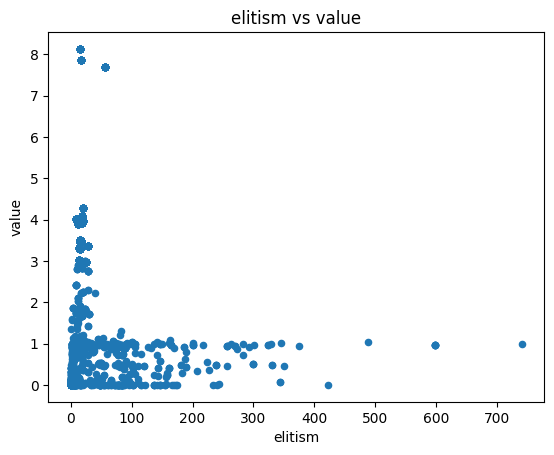

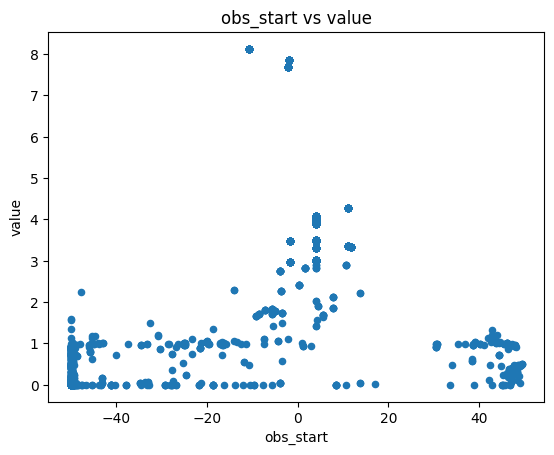

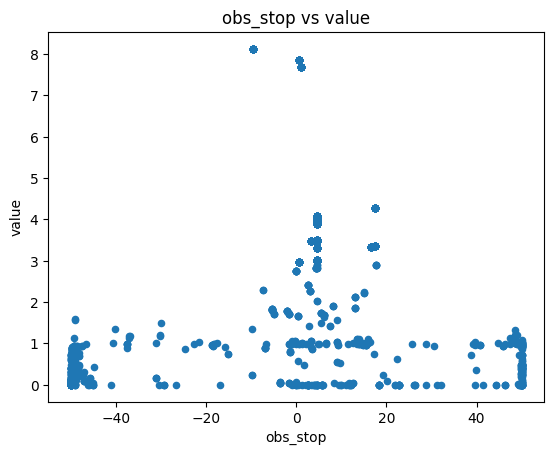

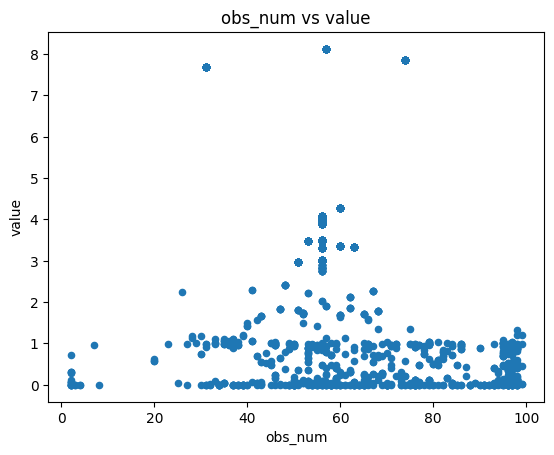

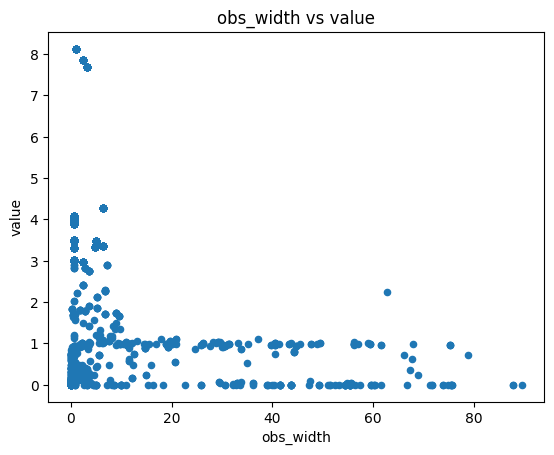

In [282]:
regress_all('value', data)

rmse


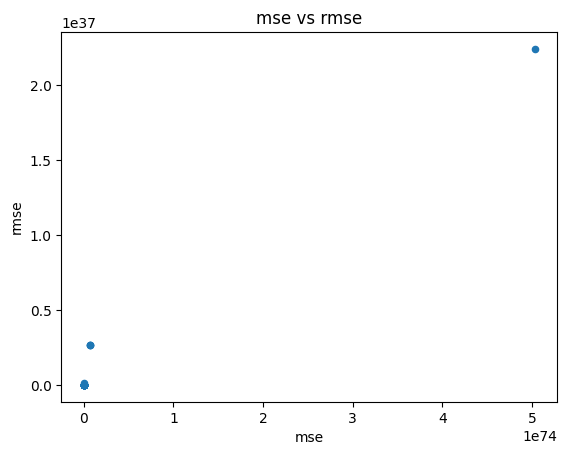

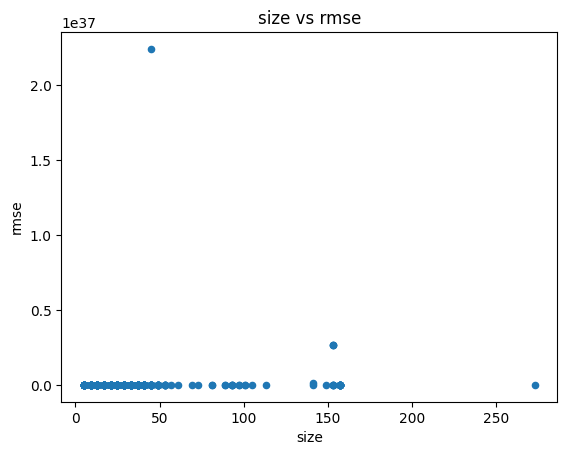

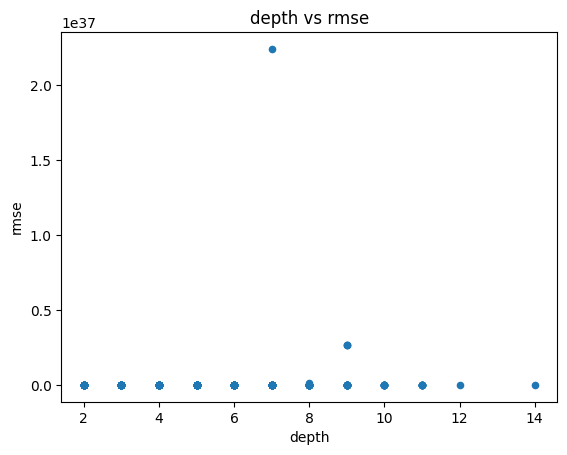

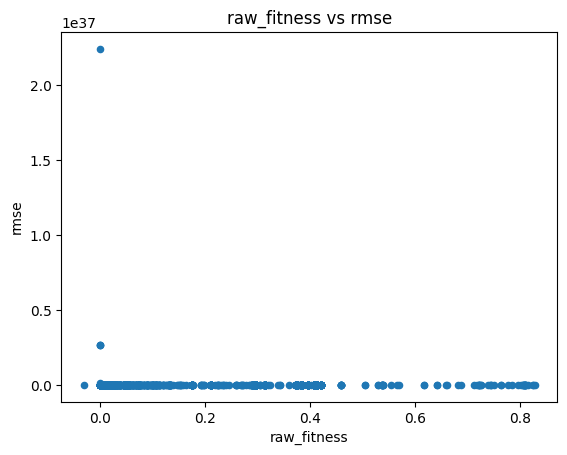

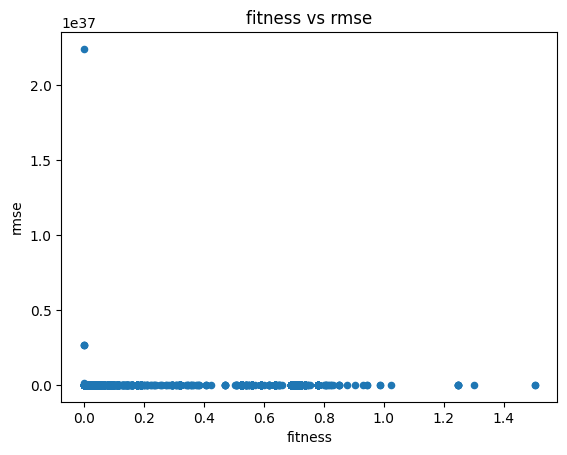

...

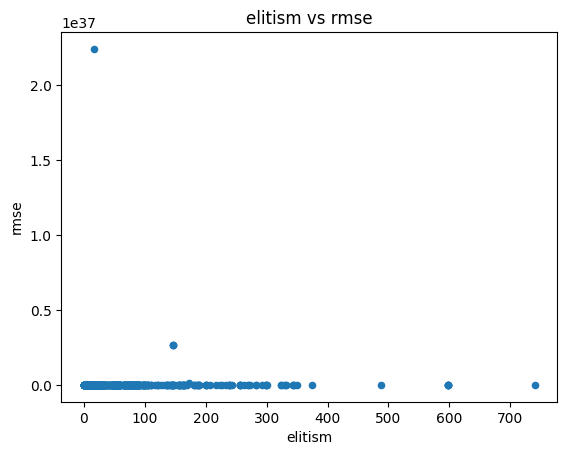

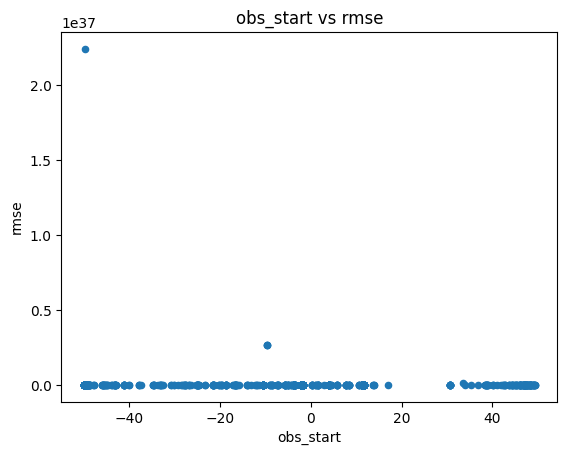

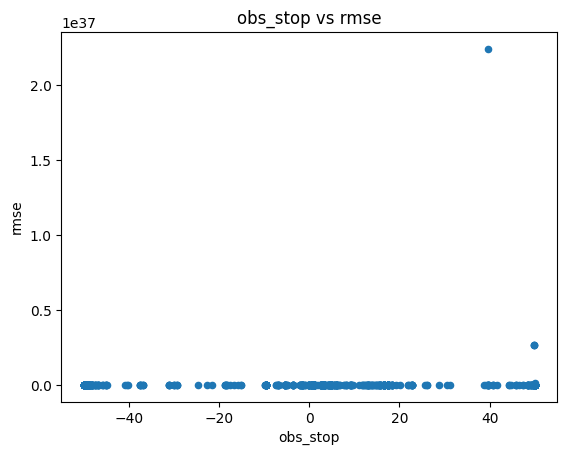

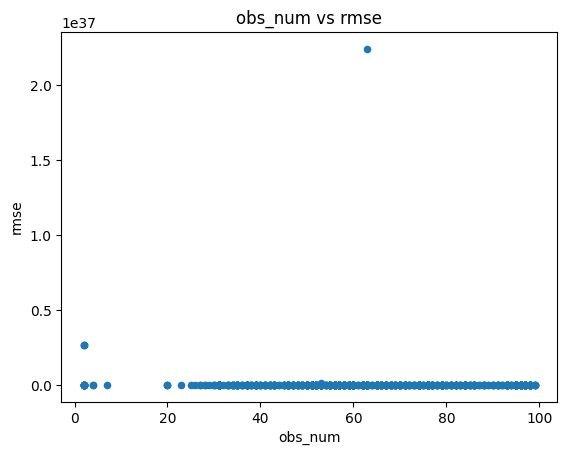

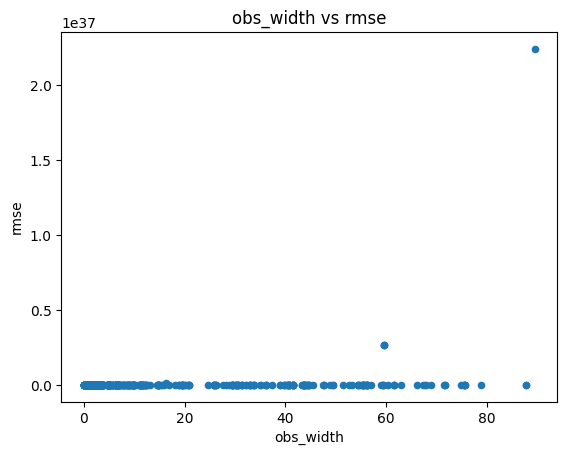

In [283]:
regress_all('rmse', data)

fitness


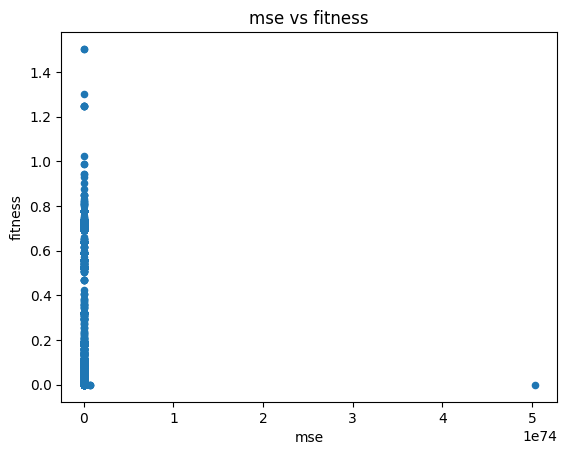

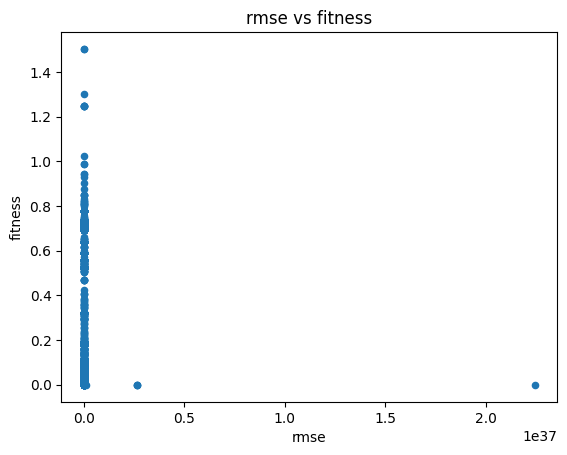

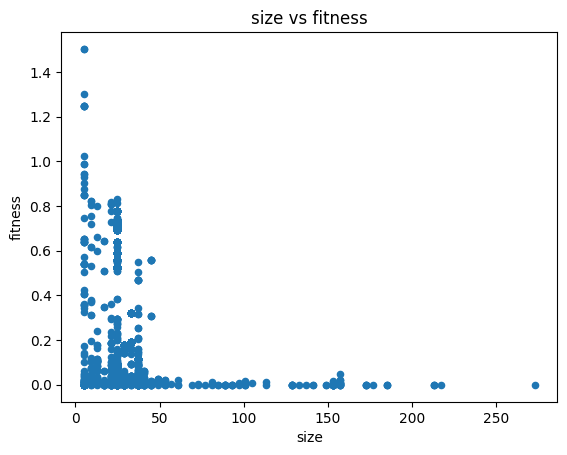

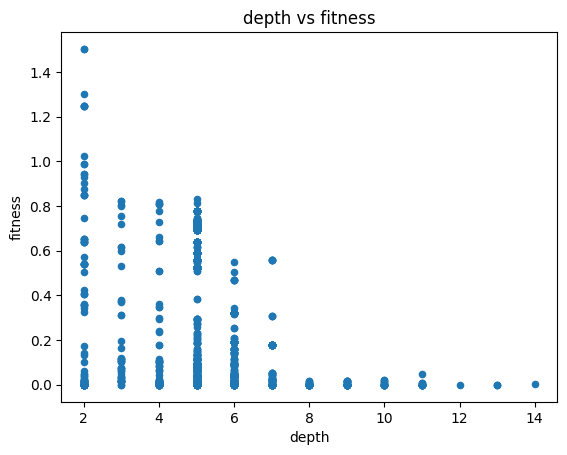

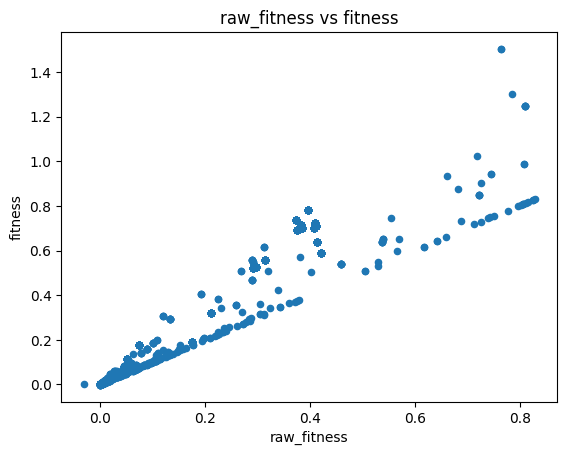

...

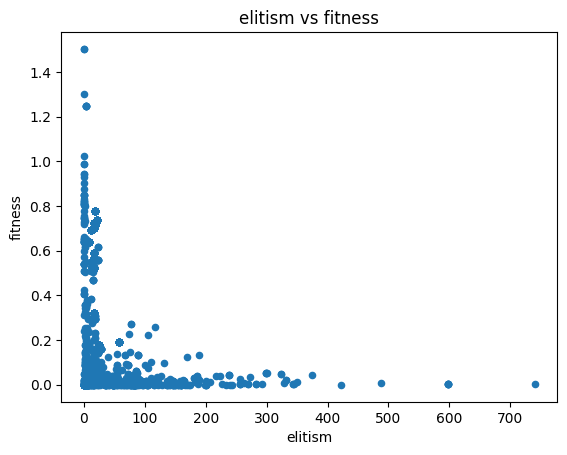

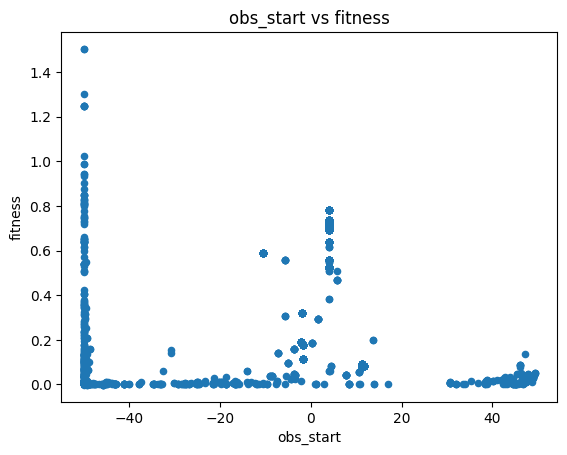

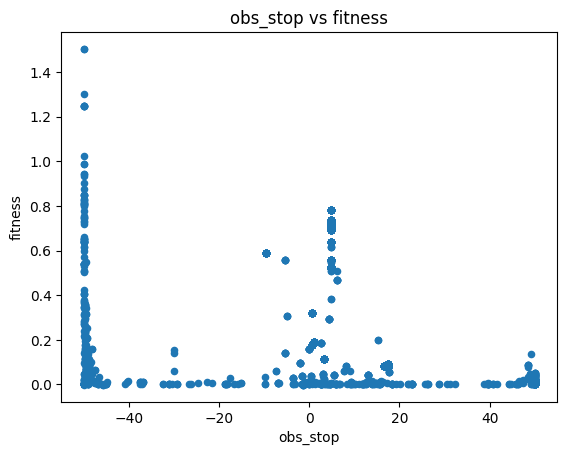

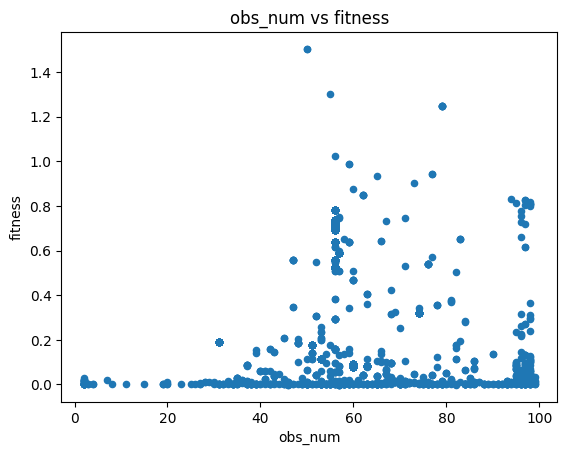

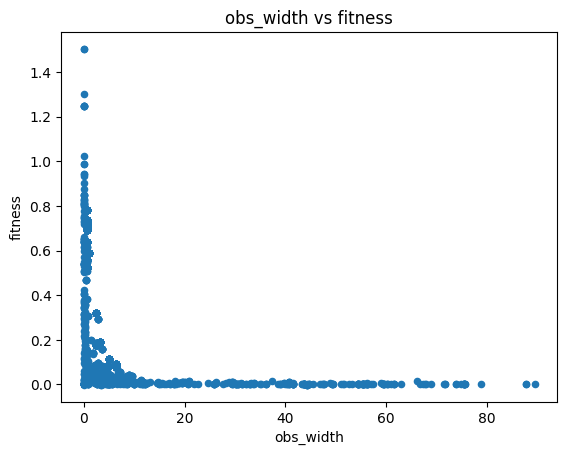

In [284]:
regress_all('fitness', data)

raw_fitness


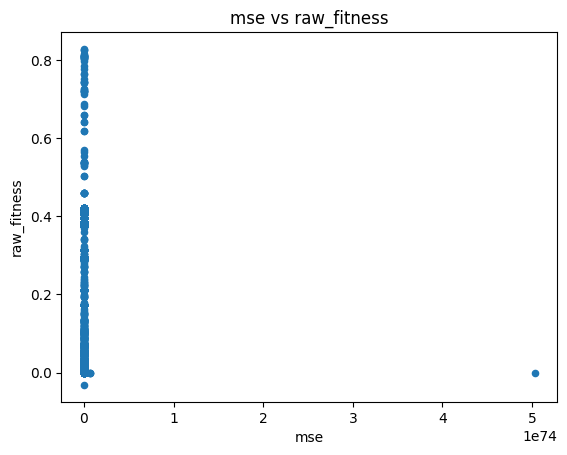

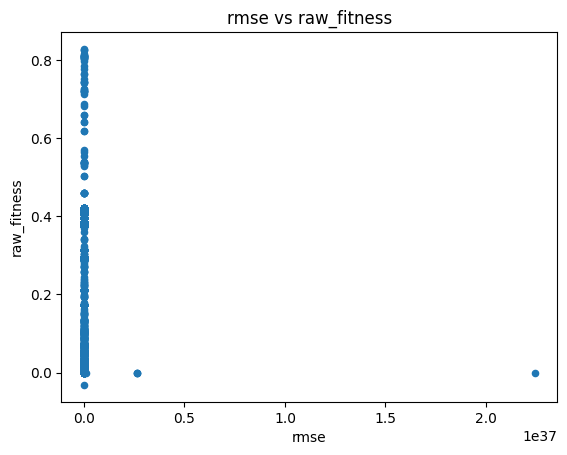

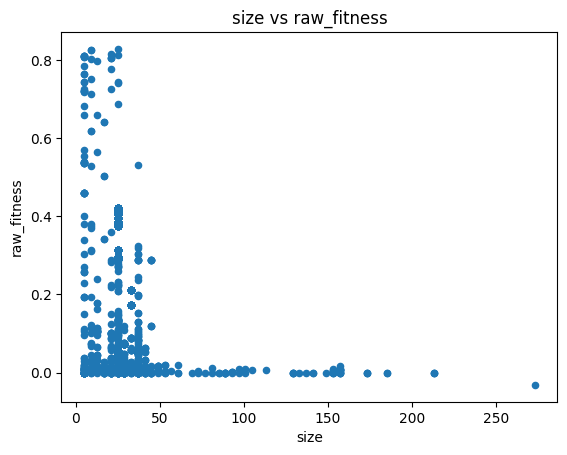

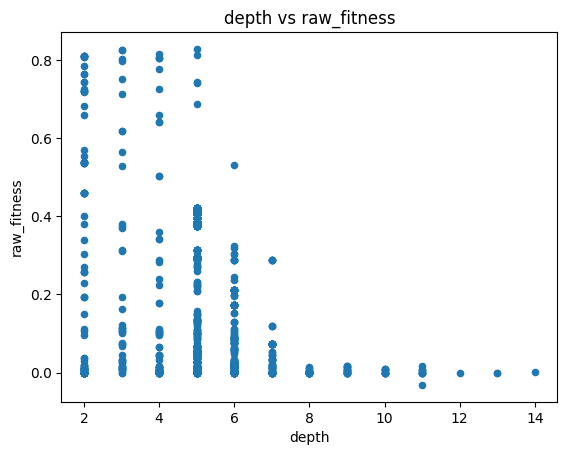

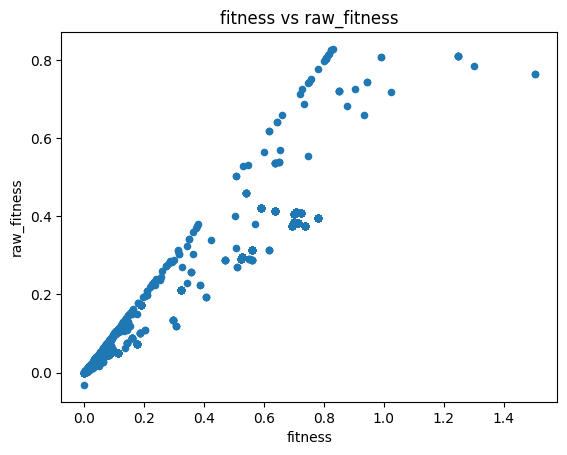

...

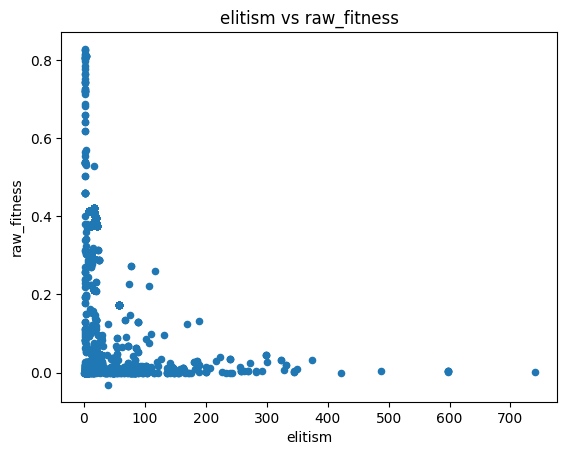

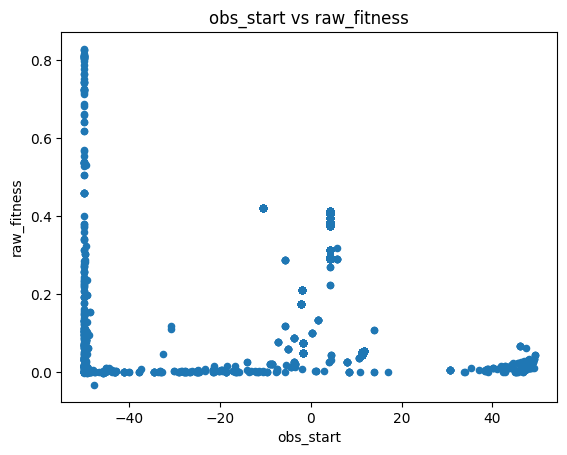

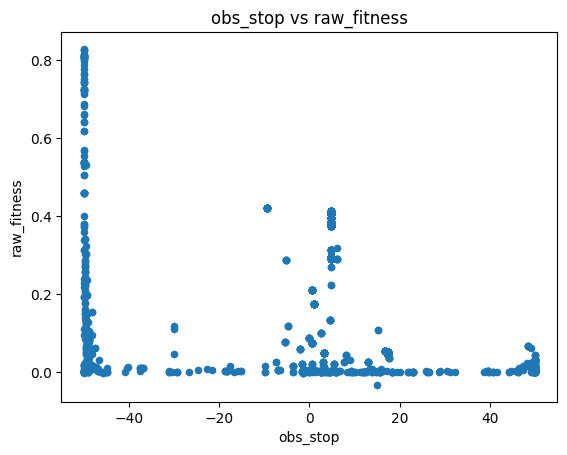

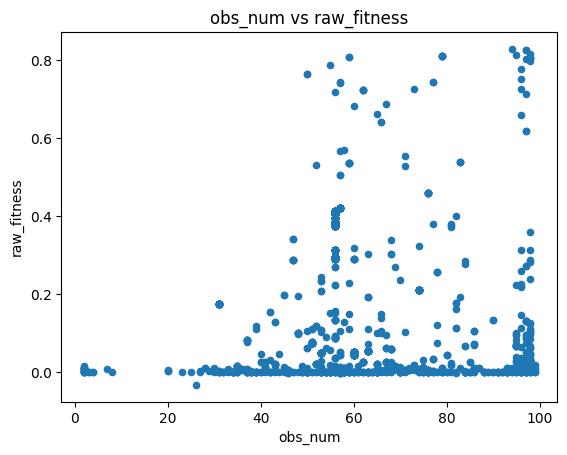

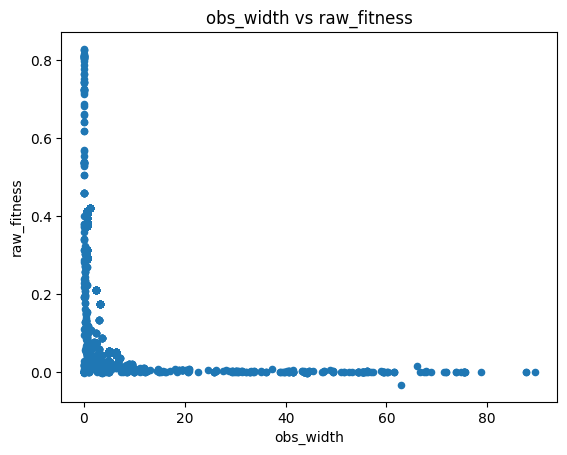

In [285]:
regress_all('raw_fitness', data)